#### Mini Capstone - Predict COVID-19 infection using Diagnostic Data

Dataset

This dataset contains anonymized data from patients seen at the Hospital Israelita Albert Einstein, at São Paulo, Brazil, and who had samples collected to perform the SARS-CoV-2 RT-PCR and additional laboratory tests during a visit to the hospital.

All data were anonymized following the best international practices and recommendations. All clinical data were standardized to have a mean of zero and a unit standard deviation.

One of the motivations for this challenge is the fact that in the context of an overwhelmed health system with the possible limitation to perform tests for the detection of SARS-CoV-2, testing every case would be impractical and tests results could be delayed even if only a target subpopulation would be tested.

In [1]:
import warnings
import numpy as np
import pandas as pd
import seaborn as sns
warnings.filterwarnings('ignore')

In [2]:
#To enable plotting graphs in Jupyter notebook
%matplotlib inline
import matplotlib.pyplot as plt

In [3]:
from scipy.stats import zscore
import seaborn as sns

In [4]:
# To visualise considerable amount of data
pd.set_option("display.max_columns",150)
pd.set_option("display.max_rows",150)

In [5]:
#Reading the dataset
covidDF = pd.read_excel("dataset.xlsx")

In [6]:
covidDF.shape

(5644, 111)

In [7]:
covidDF.dtypes

Patient ID                                                object
Patient age quantile                                       int64
SARS-Cov-2 exam result                                    object
Patient addmited to regular ward (1=yes, 0=no)             int64
Patient addmited to semi-intensive unit (1=yes, 0=no)      int64
Patient addmited to intensive care unit (1=yes, 0=no)      int64
Hematocrit                                               float64
Hemoglobin                                               float64
Platelets                                                float64
Mean platelet volume                                     float64
Red blood Cells                                          float64
Lymphocytes                                              float64
Mean corpuscular hemoglobin concentration (MCHC)         float64
Leukocytes                                               float64
Basophils                                                float64
Mean corpuscular hemoglob

In [8]:
covidDF.head()

,Patient ID,Patient age quantile,SARS-Cov-2 exam result,"Patient addmited to regular ward (1=yes, 0=no)","Patient addmited to semi-intensive unit (1=yes, 0=no)","Patient addmited to intensive care unit (1=yes, 0=no)",Hematocrit,Hemoglobin,Platelets,Mean platelet volume,Red blood Cells,Lymphocytes,Mean corpuscular hemoglobin concentration (MCHC),Leukocytes,Basophils,Mean corpuscular hemoglobin (MCH),Eosinophils,Mean corpuscular volume (MCV),Monocytes,Red blood cell distribution width (RDW),Serum Glucose,Respiratory Syncytial Virus,Influenza A,Influenza B,Parainfluenza 1,CoronavirusNL63,Rhinovirus/Enterovirus,Mycoplasma pneumoniae,Coronavirus HKU1,Parainfluenza 3,Chlamydophila pneumoniae,Adenovirus,Parainfluenza 4,Coronavirus229E,CoronavirusOC43,Inf A H1N1 2009,Bordetella pertussis,Metapneumovirus,Parainfluenza 2,Neutrophils,Urea,Proteina C reativa mg/dL,Creatinine,Potassium,Sodium,"Influenza B, rapid test","Influenza A, rapid test",Alanine transaminase,Aspartate transaminase,Gamma-glutamyltransferase,Total Bilirubin,Direct Bilirubin,Indirect Bilirubin,Alkaline phosphatase,Ionized calcium,Strepto A,Magnesium,pCO2 (venous blood gas analysis),Hb saturation (venous blood gas analysis),Base excess (venous blood gas analysis),pO2 (venous blood gas analysis),Fio2 (venous blood gas analysis),Total CO2 (venous blood gas analysis),pH (venous blood gas analysis),HCO3 (venous blood gas analysis),Rods #,Segmented,Promyelocytes,Metamyelocytes,Myelocytes,Myeloblasts,Urine - Esterase,Urine - Aspect,Urine - pH,Urine - Hemoglobin,Urine - Bile pigments,Urine - Ketone Bodies,Urine - Nitrite,Urine - Density,Urine - Urobilinogen,Urine - Protein,Urine - Sugar,Urine - Leukocytes,Urine - Crystals,Urine - Red blood cells,Urine - Hyaline cylinders,Urine - Granular cylinders,Urine - Yeasts,Urine - Color,Partial thromboplastin time (PTT),Relationship (Patient/Normal),International normalized ratio (INR),Lactic Dehydrogenase,"Prothrombin time (PT), Activity",Vitamin B12,Creatine phosphokinase (CPK),Ferritin,Arterial Lactic Acid,Lipase dosage,D-Dimer,Albumin,Hb saturation (arterial blood gases),pCO2 (arterial blood gas analysis),Base excess (arterial blood gas analysis),pH (arterial blood gas analysis),Total CO2 (arterial blood gas analysis),HCO3 (arterial blood gas analysis),pO2 (arterial blood gas analysis),Arteiral Fio2,Phosphor,ctO2 (arterial blood gas analysis)
0,44477f75e8169d2,13,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,126e9dd13932f68,17,negative,0,0,0,0.236515,-0.02234,-0.517413,0.010677,0.102004,0.318366,-0.95079,-0.09461,-0.223767,-0.292269,1.482158,0.166192,0.357547,-0.625073,-0.140648,not_detected,not_detected,not_detected,not_detected,not_detected,detected,NaN,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,-0.619086,1.198059,-0.147895,2.089928,-0.305787,0.862512,negative,negative,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,a46b4402a0e5696,8,negative,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [9]:
covidDF.describe()

,Patient age quantile,"Patient addmited to regular ward (1=yes, 0=no)","Patient addmited to semi-intensive unit (1=yes, 0=no)","Patient addmited to intensive care unit (1=yes, 0=no)",Hematocrit,Hemoglobin,Platelets,Mean platelet volume,Red blood Cells,Lymphocytes,Mean corpuscular hemoglobin concentration (MCHC),Leukocytes,Basophils,Mean corpuscular hemoglobin (MCH),Eosinophils,Mean corpuscular volume (MCV),Monocytes,Red blood cell distribution width (RDW),Serum Glucose,Mycoplasma pneumoniae,Neutrophils,Urea,Proteina C reativa mg/dL,Creatinine,Potassium,Sodium,Alanine transaminase,Aspartate transaminase,Gamma-glutamyltransferase,Total Bilirubin,Direct Bilirubin,Indirect Bilirubin,Alkaline phosphatase,Ionized calcium,Magnesium,pCO2 (venous blood gas analysis),Hb saturation (venous blood gas analysis),Base excess (venous blood gas analysis),pO2 (venous blood gas analysis),Fio2 (venous blood gas analysis),Total CO2 (venous blood gas analysis),pH (venous blood gas analysis),HCO3 (venous blood gas analysis),Rods #,Segmented,Promyelocytes,Metamyelocytes,Myelocytes,Myeloblasts,Urine - Density,Urine - Sugar,Urine - Red blood cells,Partial thromboplastin time (PTT),Relationship (Patient/Normal),International normalized ratio (INR),Lactic Dehydrogenase,"Prothrombin time (PT), Activity",Vitamin B12,Creatine phosphokinase (CPK),Ferritin,Arterial Lactic Acid,Lipase dosage,D-Dimer,Albumin,Hb saturation (arterial blood gases),pCO2 (arterial blood gas analysis),Base excess (arterial blood gas analysis),pH (arterial blood gas analysis),Total CO2 (arterial blood gas analysis),HCO3 (arterial blood gas analysis),pO2 (arterial blood gas analysis),Arteiral Fio2,Phosphor,ctO2 (arterial blood gas analysis)
count,5644.000000,5644.000000,5644.000000,5644.000000,6.030000e+02,6.030000e+02,6.020000e+02,5.990000e+02,6.020000e+02,6.020000e+02,6.020000e+02,6.020000e+02,6.020000e+02,6.020000e+02,6.020000e+02,6.020000e+02,6.010000e+02,6.020000e+02,2.080000e+02,0.0,5.130000e+02,3.970000e+02,5.060000e+02,4.240000e+02,3.710000e+02,3.700000e+02,2.250000e+02,2.260000e+02,1.530000e+02,1.820000e+02,1.820000e+02,1.820000e+02,1.440000e+02,5.000000e+01,4.000000e+01,1.360000e+02,1.360000e+02,1.360000e+02,1.360000e+02,1.0,1.360000e+02,1.360000e+02,1.360000e+02,9.700000e+01,9.700000e+01,9.700000e+01,9.700000e+01,9.700000e+01,97.0,7.000000e+01,0.0,7.000000e+01,0.0,9.100000e+01,1.330000e+02,1.010000e+02,0.0,3.000000e+00,1.040000e+02,2.300000e+01,2.700000e+01,8.000000e+00,0.0,1.300000e+01,2.700000e+01,2.700000e+01,2.700000e+01,2.700000e+01,2.700000e+01,2.700000e+01,2.700000e+01,2.000000e+01,2.000000e+01,2.700000e+01
mean,9.318391,0.013997,0.008859,0.007264,-2.186214e-09,-1.601319e-08,-3.535004e-10,7.438142e-09,8.424447e-09,-7.866736e-09,1.014863e-09,6.215833e-09,-6.633740e-09,-3.453010e-09,7.206147e-09,-4.155369e-09,-3.220114e-09,1.020433e-08,7.069992e-09,NaN,5.908361e-09,-6.675260e-09,2.779703e-09,-6.679604e-09,2.038366e-08,1.123628e-08,2.719462e-09,-5.439583e-10,-1.479159e-09,-2.783733e-09,1.205602e-08,3.029357e-09,-2.037268e-09,1.907349e-08,-5.215406e-09,-1.935234e-08,1.509290e-08,-1.075130e-09,-7.909394e-09,0.0,-9.121483e-09,3.593467e-09,-4.416934e-09,2.611544e-09,-2.678753e-08,7.373770e-09,8.602732e-09,1.382582e-08,0.0,-2.554485e-09,NaN,7.557017e-09,NaN,-9.824941e-10,-4.733640e-09,1.733551e-09,NaN,-1.986821e-08,-6.483438e-09,7.288611e-09,-1.655685e-09,-3.725290e-09,NaN,-5.731216e-09,-1.379737e-10,8.416397e-09,-1.655685e-09,4.139211e-10,-7.472139e-09,6.070843e-09,-2.469729e-08,4.656613e-09,6.332993e-09,5.243001e-09
std,5.777903,0.117489,0.093713,0.084929,1.000830e+00,1.000830e+00,1.000832e+00,1.000836e+00,1.000832e+00,1.000832e+00,1.000832e+00,1.000832e+00,1.000832e+00,1.000832e+00,1.000832e+00,1.000832e+00,1.000833e+00,1.000832e+00,1.002413e+00,NaN,1.000976e+00,1.001262e+00,1.000990e+00,1.001181e+00,1.001350e+00,1.001354e+00,1.002230e+00,1.002220e+00,1.003284e+00,1.002759e+00,1.002759e+00,1.002759e+00,1.003490e+00,1.010153e+00,1.012739e+00,1.003697e+00,1.003697e+00,1.0036

In [10]:
# Checking the target column distribution
covidDF["SARS-Cov-2 exam result"].value_counts()

negative    5086
positive     558
Name: SARS-Cov-2 exam result, dtype: int64

<AxesSubplot:xlabel='SARS-Cov-2 exam result', ylabel='count'>

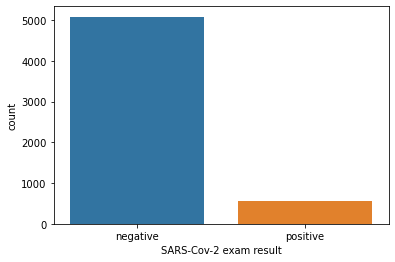

In [11]:
sns.countplot(covidDF["SARS-Cov-2 exam result"])

In [12]:
#Dropping columns which are not relevant to diagnostic data
covidDF.drop(['Patient addmited to regular ward (1=yes, 0=no)','Patient addmited to semi-intensive unit (1=yes, 0=no)','Patient addmited to intensive care unit (1=yes, 0=no)'],axis=1,inplace=True)

In [13]:
targetVariable = covidDF['SARS-Cov-2 exam result']

In [14]:
type(covidDF.dtypes)

pandas.core.series.Series

In [15]:
numericalAttr = [key for key in dict(covidDF.dtypes)
                   if dict(covidDF.dtypes)[key]
                       in ['float64','float32','int32','int64']] # Numeric Variable

categoricalAttr = [key for key in dict(covidDF.dtypes)
             if dict(covidDF.dtypes)[key] in ['object'] ] # Categorical Varible

In [16]:
len(numericalAttr)

71

In [17]:
len(categoricalAttr)

37

In [18]:
#Categorical variables
covidDFCat = covidDF[covidDF.select_dtypes(include=['object']).columns.tolist()]

In [19]:
covidDFCat.head(5)

,Patient ID,SARS-Cov-2 exam result,Respiratory Syncytial Virus,Influenza A,Influenza B,Parainfluenza 1,CoronavirusNL63,Rhinovirus/Enterovirus,Coronavirus HKU1,Parainfluenza 3,Chlamydophila pneumoniae,Adenovirus,Parainfluenza 4,Coronavirus229E,CoronavirusOC43,Inf A H1N1 2009,Bordetella pertussis,Metapneumovirus,Parainfluenza 2,"Influenza B, rapid test","Influenza A, rapid test",Strepto A,Urine - Esterase,Urine - Aspect,Urine - pH,Urine - Hemoglobin,Urine - Bile pigments,Urine - Ketone Bodies,Urine - Nitrite,Urine - Urobilinogen,Urine - Protein,Urine - Leukocytes,Urine - Crystals,Urine - Hyaline cylinders,Urine - Granular cylinders,Urine - Yeasts,Urine - Color
0,44477f75e8169d2,negative,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,126e9dd13932f68,negative,not_detected,not_detected,not_detected,not_detected,not_detected,detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,negative,negative,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,a46b4402a0e5696,negative,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,f7d619a94f97c45,negative,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,d9e41465789c2b5,negative,not_detected,not_detected,not_detected,not_detected,not_detected,detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,not_detected,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [20]:
covidDFCat.duplicated()

0       False
1       False
2       False
3       False
4       False
        ...  
5639    False
5640    False
5641    False
5642    False
5643    False
Length: 5644, dtype: bool

In [21]:
covidDFCat = covidDFCat.drop_duplicates()

In [22]:
covidDFCat.shape

(5644, 37)

In [23]:
null_df = covidDFCat.isna().sum()
null_df

Patient ID                        0
SARS-Cov-2 exam result            0
Respiratory Syncytial Virus    4290
Influenza A                    4290
Influenza B                    4290
Parainfluenza 1                4292
CoronavirusNL63                4292
Rhinovirus/Enterovirus         4292
Coronavirus HKU1               4292
Parainfluenza 3                4292
Chlamydophila pneumoniae       4292
Adenovirus                     4292
Parainfluenza 4                4292
Coronavirus229E                4292
CoronavirusOC43                4292
Inf A H1N1 2009                4292
Bordetella pertussis           4292
Metapneumovirus                4292
Parainfluenza 2                4292
Influenza B, rapid test        4824
Influenza A, rapid test        4824
Strepto A                      5312
Urine - Esterase               5584
Urine - Aspect                 5574
Urine - pH                     5574
Urine - Hemoglobin             5574
Urine - Bile pigments          5574
Urine - Ketone Bodies       

In [24]:
#Percentage of null values
null_pct = null_df/covidDFCat.shape[0]*100
null_pct

Patient ID                      0.000000
SARS-Cov-2 exam result          0.000000
Respiratory Syncytial Virus    76.009922
Influenza A                    76.009922
Influenza B                    76.009922
Parainfluenza 1                76.045358
CoronavirusNL63                76.045358
Rhinovirus/Enterovirus         76.045358
Coronavirus HKU1               76.045358
Parainfluenza 3                76.045358
Chlamydophila pneumoniae       76.045358
Adenovirus                     76.045358
Parainfluenza 4                76.045358
Coronavirus229E                76.045358
CoronavirusOC43                76.045358
Inf A H1N1 2009                76.045358
Bordetella pertussis           76.045358
Metapneumovirus                76.045358
Parainfluenza 2                76.045358
Influenza B, rapid test        85.471297
Influenza A, rapid test        85.471297
Strepto A                      94.117647
Urine - Esterase               98.936924
Urine - Aspect                 98.759745
Urine - pH      

All the features have null values more than 70%.

In [25]:
#Numerical Variables
covidDF = covidDF[covidDF.select_dtypes(exclude=['object']).columns.tolist()]

In [26]:
covidDF['SARS-Cov-2 exam result'] = targetVariable

In [27]:
covidDF.shape

(5644, 72)

In [28]:
covidDF[covidDF.duplicated()]

,Patient age quantile,Hematocrit,Hemoglobin,Platelets,Mean platelet volume,Red blood Cells,Lymphocytes,Mean corpuscular hemoglobin concentration (MCHC),Leukocytes,Basophils,Mean corpuscular hemoglobin (MCH),Eosinophils,Mean corpuscular volume (MCV),Monocytes,Red blood cell distribution width (RDW),Serum Glucose,Mycoplasma pneumoniae,Neutrophils,Urea,Proteina C reativa mg/dL,Creatinine,Potassium,Sodium,Alanine transaminase,Aspartate transaminase,Gamma-glutamyltransferase,Total Bilirubin,Direct Bilirubin,Indirect Bilirubin,Alkaline phosphatase,Ionized calcium,Magnesium,pCO2 (venous blood gas analysis),Hb saturation (venous blood gas analysis),Base excess (venous blood gas analysis),pO2 (venous blood gas analysis),Fio2 (venous blood gas analysis),Total CO2 (venous blood gas analysis),pH (venous blood gas analysis),HCO3 (venous blood gas analysis),Rods #,Segmented,Promyelocytes,Metamyelocytes,Myelocytes,Myeloblasts,Urine - Density,Urine - Sugar,Urine - Red blood cells,Partial thromboplastin time (PTT),Relationship (Patient/Normal),International normalized ratio (INR),Lactic Dehydrogenase,"Prothrombin time (PT), Activity",Vitamin B12,Creatine phosphokinase (CPK),Ferritin,Arterial Lactic Acid,Lipase dosage,D-Dimer,Albumin,Hb saturation (arterial blood gases),pCO2 (arterial blood gas analysis),Base excess (arterial blood gas analysis),pH (arterial blood gas analysis),Total CO2 (arterial blood gas analysis),HCO3 (arterial blood gas analysis),pO2 (arterial blood gas analysis),Arteiral Fio2,Phosphor,ctO2 (arterial blood gas analysis),SARS-Cov-2 exam result
6,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,negative
10,8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,negative
12,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,negative
13,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,negative
16,15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,negative
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5637,12,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,negative
5638,14,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,negative
5639,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Na

In [29]:
covidDF.drop_duplicates(inplace=True)

In [30]:
targetVariable = covidDF['SARS-Cov-2 exam result']

In [31]:
covidDF.shape

(664, 72)

In [32]:
null_df = covidDF.isna().sum()
null_df

Patient age quantile                                  0
Hematocrit                                           61
Hemoglobin                                           61
Platelets                                            62
Mean platelet volume                                 65
Red blood Cells                                      62
Lymphocytes                                          62
Mean corpuscular hemoglobin concentration (MCHC)     62
Leukocytes                                           62
Basophils                                            62
Mean corpuscular hemoglobin (MCH)                    62
Eosinophils                                          62
Mean corpuscular volume (MCV)                        62
Monocytes                                            63
Red blood cell distribution width (RDW)              62
Serum Glucose                                       456
Mycoplasma pneumoniae                               664
Neutrophils                                     

In [33]:
null_pct = null_df/covidDF.shape[0]*100
null_pct

Patient age quantile                                  0.000000
Hematocrit                                            9.186747
Hemoglobin                                            9.186747
Platelets                                             9.337349
Mean platelet volume                                  9.789157
Red blood Cells                                       9.337349
Lymphocytes                                           9.337349
Mean corpuscular hemoglobin concentration (MCHC)      9.337349
Leukocytes                                            9.337349
Basophils                                             9.337349
Mean corpuscular hemoglobin (MCH)                     9.337349
Eosinophils                                           9.337349
Mean corpuscular volume (MCV)                         9.337349
Monocytes                                             9.487952
Red blood cell distribution width (RDW)               9.337349
Serum Glucose                                        68

In [34]:
#Dropping features with Null values more than 40%
nulls = null_pct[null_pct > 40]

covidDF = covidDF[[col for col in covidDF.columns if col not in nulls]]

covidDF.shape

(664, 19)

In [35]:
covidDF.isna().sum()

Patient age quantile                                  0
Hematocrit                                           61
Hemoglobin                                           61
Platelets                                            62
Mean platelet volume                                 65
Red blood Cells                                      62
Lymphocytes                                          62
Mean corpuscular hemoglobin concentration (MCHC)     62
Leukocytes                                           62
Basophils                                            62
Mean corpuscular hemoglobin (MCH)                    62
Eosinophils                                          62
Mean corpuscular volume (MCV)                        62
Monocytes                                            63
Red blood cell distribution width (RDW)              62
Neutrophils                                         151
Proteina C reativa mg/dL                            158
Creatinine                                      

In [36]:
Y = targetVariable

In [37]:
X = covidDF.drop('SARS-Cov-2 exam result',axis=1)

In [38]:
column = X.columns

In [39]:
column

Index(['Patient age quantile', 'Hematocrit', 'Hemoglobin', 'Platelets',
       'Mean platelet volume ', 'Red blood Cells', 'Lymphocytes',
       'Mean corpuscular hemoglobin concentration (MCHC)', 'Leukocytes',
       'Basophils', 'Mean corpuscular hemoglobin (MCH)', 'Eosinophils',
       'Mean corpuscular volume (MCV)', 'Monocytes',
       'Red blood cell distribution width (RDW)', 'Neutrophils',
       'Proteina C reativa mg/dL', 'Creatinine'],
      dtype='object')

In [40]:
from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors=5)
imputer.fit(X)

KNNImputer()

In [41]:
temp = imputer.transform(X)

In [42]:
X = pd.DataFrame(temp, columns=column)
X.head(5)

,Patient age quantile,Hematocrit,Hemoglobin,Platelets,Mean platelet volume,Red blood Cells,Lymphocytes,Mean corpuscular hemoglobin concentration (MCHC),Leukocytes,Basophils,Mean corpuscular hemoglobin (MCH),Eosinophils,Mean corpuscular volume (MCV),Monocytes,Red blood cell distribution width (RDW),Neutrophils,Proteina C reativa mg/dL,Creatinine
0,13.0,0.318914,0.265878,-0.293813,-0.550290,0.169000,0.502593,-0.074503,-0.367880,-0.468134,0.366353,0.091559,0.446606,0.740990,-0.554308,-0.328989,-0.152664,0.201467
1,17.0,0.236515,-0.022340,-0.517413,0.010677,0.102004,0.318366,-0.950790,-0.094610,-0.223767,-0.292269,1.482158,0.166192,0.357547,-0.625073,-0.619086,-0.147895,2.089928
2,8.0,0.131228,0.316002,-0.060163,0.549204,0.500450,0.350776,0.821702,-0.091828,0.081693,-0.030911,-0.178133,-0.418671,0.362799,-0.536616,0.095504,-0.157830,-0.212065
3,5.0,0.927750,0.930031,-0.140559,0.145308,0.609758,0.640764,0.562798,-0.509803,0.203876,0.261810,0.040991,-0.014074,0.210473,-0.253555,-0.363407,0.160887,-0.205173
4,15.0,0.030518,-0.047402,-0.273714,-0.460535,-0.165977,0.052260,0.224232,-0.548205,0.081693,-0.093637,-0.034859,-0.210364,0.410073,-0.076643,-0.556805,-0.304869,-0.136251


In [43]:
X.isnull().sum()

Patient age quantile                                0
Hematocrit                                          0
Hemoglobin                                          0
Platelets                                           0
Mean platelet volume                                0
Red blood Cells                                     0
Lymphocytes                                         0
Mean corpuscular hemoglobin concentration (MCHC)    0
Leukocytes                                          0
Basophils                                           0
Mean corpuscular hemoglobin (MCH)                   0
Eosinophils                                         0
Mean corpuscular volume (MCV)                       0
Monocytes                                           0
Red blood cell distribution width (RDW)             0
Neutrophils                                         0
Proteina C reativa mg/dL                            0
Creatinine                                          0
dtype: int64

All Null values were treated

In [44]:
X.var()

Patient age quantile                                33.716184
Hematocrit                                           0.941085
Hemoglobin                                           0.939466
Platelets                                            0.936231
Mean platelet volume                                 0.932704
Red blood Cells                                      0.962198
Lymphocytes                                          0.928226
Mean corpuscular hemoglobin concentration (MCHC)     0.925026
Leukocytes                                           0.946005
Basophils                                            0.928780
Mean corpuscular hemoglobin (MCH)                    0.926051
Eosinophils                                          0.917269
Mean corpuscular volume (MCV)                        0.934920
Monocytes                                            0.940429
Red blood cell distribution width (RDW)              0.927029
Neutrophils                                          0.881966
Proteina

In [45]:
X.columns

Index(['Patient age quantile', 'Hematocrit', 'Hemoglobin', 'Platelets',
       'Mean platelet volume ', 'Red blood Cells', 'Lymphocytes',
       'Mean corpuscular hemoglobin concentration (MCHC)', 'Leukocytes',
       'Basophils', 'Mean corpuscular hemoglobin (MCH)', 'Eosinophils',
       'Mean corpuscular volume (MCV)', 'Monocytes',
       'Red blood cell distribution width (RDW)', 'Neutrophils',
       'Proteina C reativa mg/dL', 'Creatinine'],
      dtype='object')

In [46]:
X.shape

(664, 18)

In [47]:
Y.shape

(664,)

In [48]:
X.skew()

Patient age quantile                               -0.297845
Hematocrit                                         -0.717901
Hemoglobin                                         -0.615520
Platelets                                           1.763333
Mean platelet volume                                0.469911
Red blood Cells                                    -0.344314
Lymphocytes                                         0.439988
Mean corpuscular hemoglobin concentration (MCHC)   -0.573389
Leukocytes                                          1.396056
Basophils                                           2.988670
Mean corpuscular hemoglobin (MCH)                  -1.151664
Eosinophils                                         2.860260
Mean corpuscular volume (MCV)                      -0.674769
Monocytes                                           0.999591
Red blood cell distribution width (RDW)             2.460324
Neutrophils                                        -0.080072
Proteina C reativa mg/dL

##### Distplot and Boxplot and Treating Outliers

<AxesSubplot:>

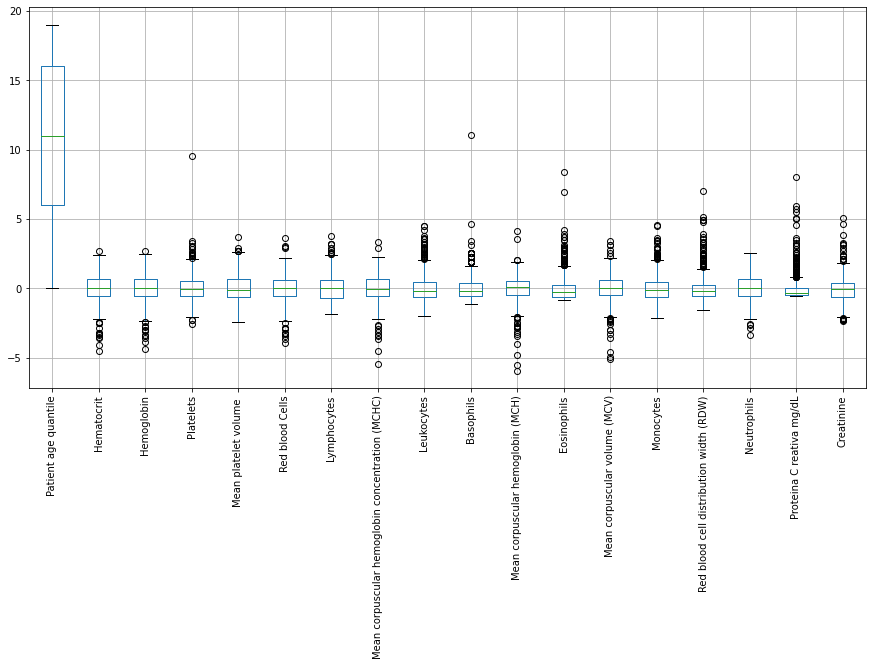

In [49]:
X.boxplot(figsize= (15,7), rot =90)

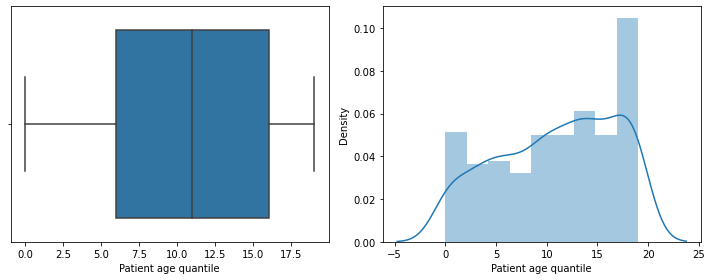

In [50]:
plt.figure(figsize = (10,4))
plt.subplot(1,2,1)
sns.boxplot(X["Patient age quantile"])
plt.subplot(1,2,2)
sns.distplot(X["Patient age quantile"])
plt.tight_layout()

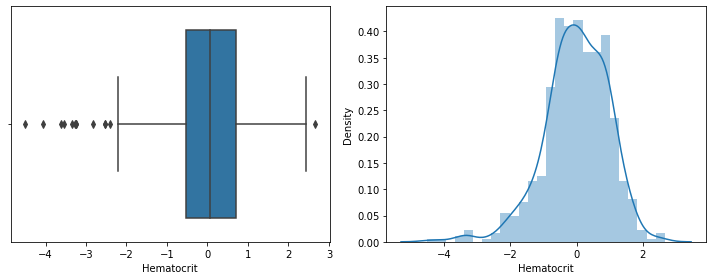

In [51]:
plt.figure(figsize = (10,4))
plt.subplot(1,2,1)
sns.boxplot(X["Hematocrit"])
plt.subplot(1,2,2)
sns.distplot(X["Hematocrit"])
plt.tight_layout()

Hematocrit is negatively skewed and has many outliers less than the minimum value in box plot.

In [52]:
X['Hematocrit'] = np.where(X["Hematocrit"] >2, 2, X["Hematocrit"])
X['Hematocrit'] = np.where(X["Hematocrit"] <-2, -2, X["Hematocrit"])

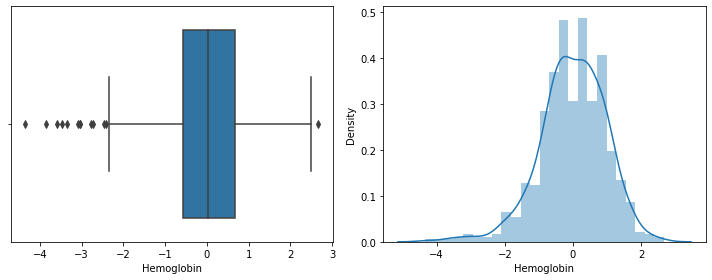

In [53]:
plt.figure(figsize = (10,4))
plt.subplot(1,2,1)
sns.boxplot(X['Hemoglobin'])
plt.subplot(1,2,2)
sns.distplot(X['Hemoglobin'])
plt.tight_layout()

In [54]:
X['Hemoglobin'] = np.where(X['Hemoglobin'] >2, 2, X['Hemoglobin'])
X['Hemoglobin'] = np.where(X['Hemoglobin'] <-2, -2, X['Hemoglobin'])

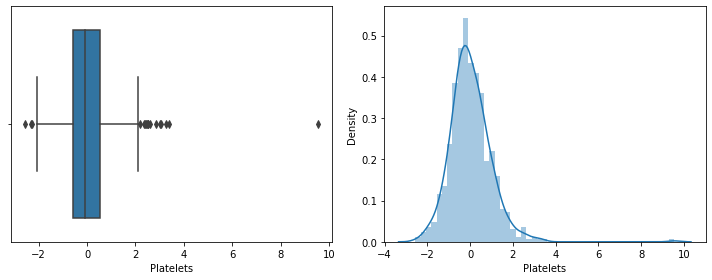

In [55]:
plt.figure(figsize = (10,4))
plt.subplot(1,2,1)
sns.boxplot(X['Platelets'])
plt.subplot(1,2,2)
sns.distplot(X['Platelets'])
plt.tight_layout()

In [56]:
X['Platelets'] = np.where(X['Platelets'] >2, 2, X['Platelets'])
X['Platelets'] = np.where(X['Platelets'] <-2, -2, X['Platelets'])

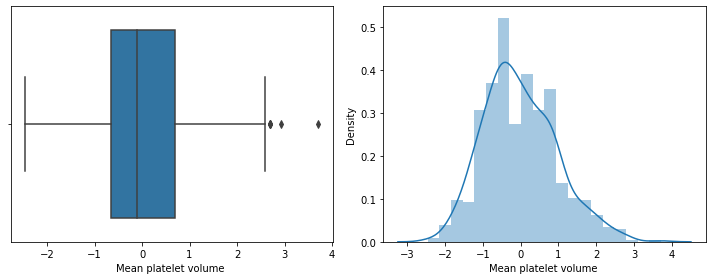

In [57]:
plt.figure(figsize = (10,4))
plt.subplot(1,2,1)
sns.boxplot(X['Mean platelet volume '])
plt.subplot(1,2,2)
sns.distplot(X['Mean platelet volume '])
plt.tight_layout()

In [58]:
X['Mean platelet volume '] = np.where(X['Mean platelet volume '] >2, 2, X['Mean platelet volume '])

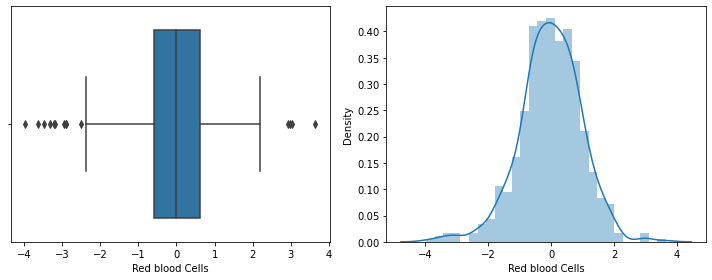

In [59]:
plt.figure(figsize = (10,4))
plt.subplot(1,2,1)
sns.boxplot(X['Red blood Cells'])
plt.subplot(1,2,2)
sns.distplot(X['Red blood Cells'])
plt.tight_layout()

In [60]:
X['Red blood Cells'] = np.where(X['Red blood Cells'] >2, 2, X['Red blood Cells'])
X['Red blood Cells'] = np.where(X['Red blood Cells'] <-2, -2, X['Red blood Cells'])

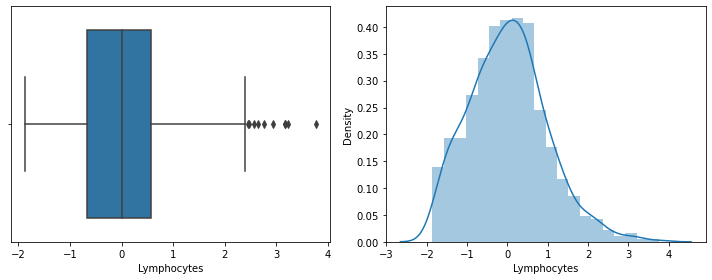

In [61]:
plt.figure(figsize = (10,4))
plt.subplot(1,2,1)
sns.boxplot(X['Lymphocytes'])
plt.subplot(1,2,2)
sns.distplot(X['Lymphocytes'])
plt.tight_layout()

In [62]:
X['Lymphocytes'] = np.where(X['Lymphocytes'] >2, 2, X['Lymphocytes'])

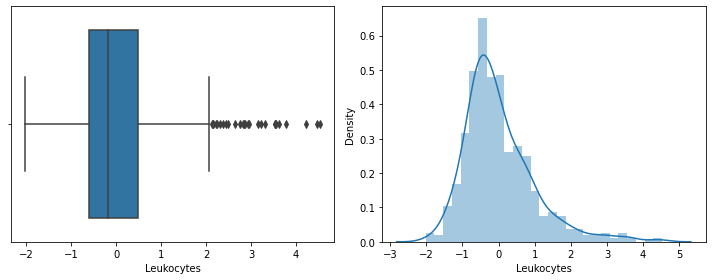

In [63]:
plt.figure(figsize = (10,4))
plt.subplot(1,2,1)
sns.boxplot(X['Leukocytes'])
plt.subplot(1,2,2)
sns.distplot(X['Leukocytes'])
plt.tight_layout()

In [64]:
X['Leukocytes'] = np.where(X['Leukocytes'] >2, 2, X['Leukocytes'])

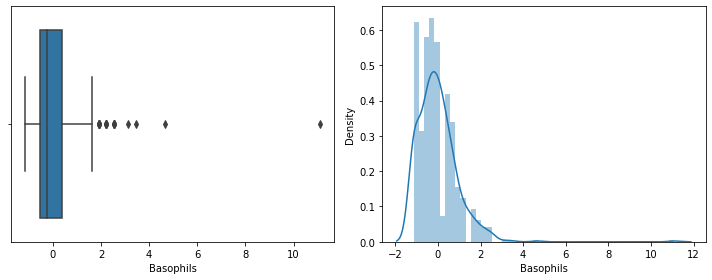

In [65]:
plt.figure(figsize = (10,4))
plt.subplot(1,2,1)
sns.boxplot(X['Basophils'])
plt.subplot(1,2,2)
sns.distplot(X['Basophils'])
plt.tight_layout()

In [66]:
X['Basophils'] = np.where(X['Basophils'] >2, 2, X['Basophils'])

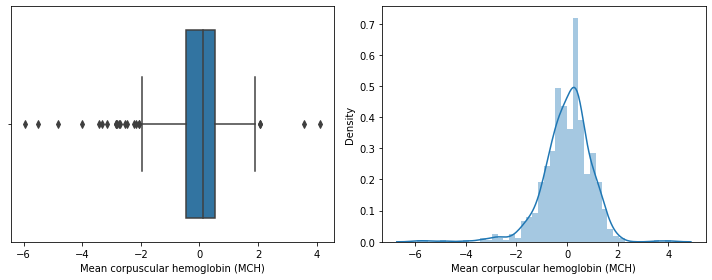

In [67]:
plt.figure(figsize = (10,4))
plt.subplot(1,2,1)
sns.boxplot(X['Mean corpuscular hemoglobin (MCH)'])
plt.subplot(1,2,2)
sns.distplot(X['Mean corpuscular hemoglobin (MCH)'])
plt.tight_layout()

In [68]:
X['Mean corpuscular hemoglobin (MCH)'] = np.where(X['Mean corpuscular hemoglobin (MCH)'] >2, 2, X['Mean corpuscular hemoglobin (MCH)'])
X['Mean corpuscular hemoglobin (MCH)'] = np.where(X['Mean corpuscular hemoglobin (MCH)'] <-2, -2, X['Mean corpuscular hemoglobin (MCH)'])

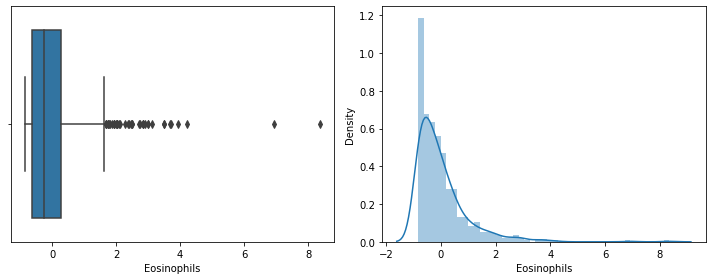

In [69]:
plt.figure(figsize = (10,4))
plt.subplot(1,2,1)
sns.boxplot(X['Eosinophils'])
plt.subplot(1,2,2)
sns.distplot(X['Eosinophils'])
plt.tight_layout()

In [70]:
X['Eosinophils'] = np.where(X['Eosinophils'] >2, 2, X['Eosinophils'])

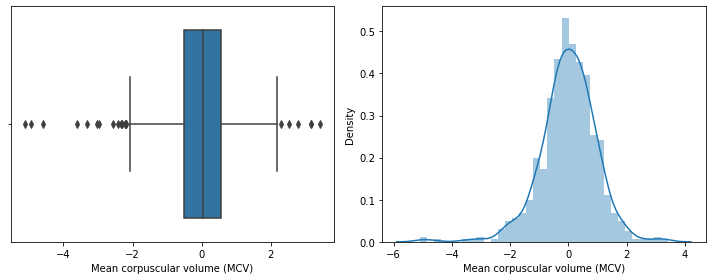

In [71]:
plt.figure(figsize = (10,4))
plt.subplot(1,2,1)
sns.boxplot(X['Mean corpuscular volume (MCV)'])
plt.subplot(1,2,2)
sns.distplot(X['Mean corpuscular volume (MCV)'])
plt.tight_layout()

In [72]:
X['Mean corpuscular volume (MCV)'] = np.where(X['Mean corpuscular volume (MCV)'] >2, 2, X['Mean corpuscular volume (MCV)'])
X['Mean corpuscular volume (MCV)'] = np.where(X['Mean corpuscular volume (MCV)'] <-2, -2, X['Mean corpuscular volume (MCV)'])

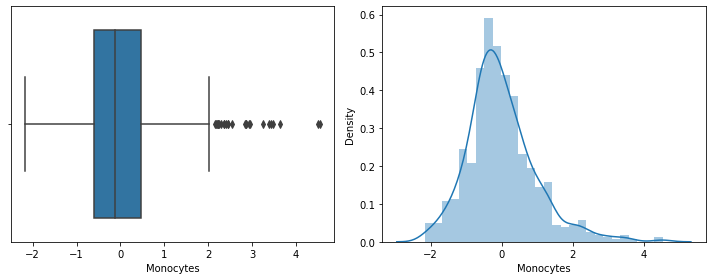

In [73]:
plt.figure(figsize = (10,4))
plt.subplot(1,2,1)
sns.boxplot(X['Monocytes'])
plt.subplot(1,2,2)
sns.distplot(X['Monocytes'])
plt.tight_layout()

In [74]:
X['Monocytes'] = np.where(X['Monocytes'] >2, 2, X['Monocytes'])

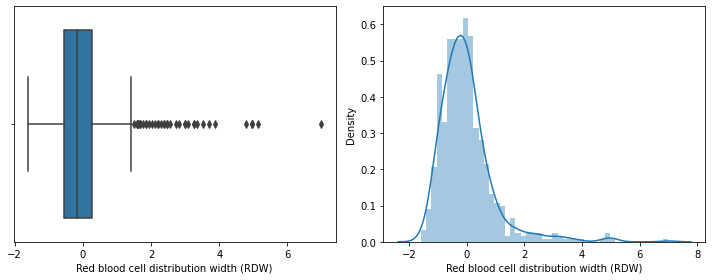

In [75]:
plt.figure(figsize = (10,4))
plt.subplot(1,2,1)
sns.boxplot(X['Red blood cell distribution width (RDW)'])
plt.subplot(1,2,2)
sns.distplot(X['Red blood cell distribution width (RDW)'])
plt.tight_layout()

In [76]:
X['Red blood cell distribution width (RDW)'] = np.where(X['Red blood cell distribution width (RDW)'] >1.5, 1.5, X['Red blood cell distribution width (RDW)'])

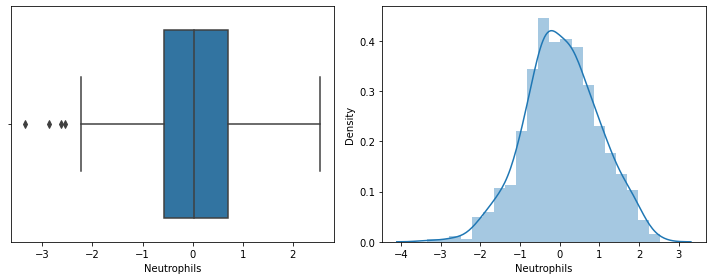

In [77]:
plt.figure(figsize = (10,4))
plt.subplot(1,2,1)
sns.boxplot(X['Neutrophils'])
plt.subplot(1,2,2)
sns.distplot(X['Neutrophils'])
plt.tight_layout()

In [78]:
X['Neutrophils'] = np.where(X['Neutrophils'] <-2, -2, X['Neutrophils'])

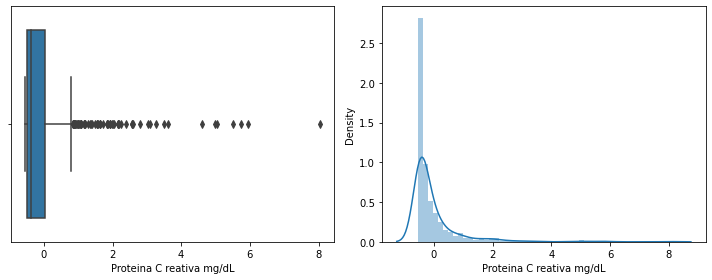

In [79]:
plt.figure(figsize = (10,4))
plt.subplot(1,2,1)
sns.boxplot(X['Proteina C reativa mg/dL'])
plt.subplot(1,2,2)
sns.distplot(X['Proteina C reativa mg/dL'])
plt.tight_layout()

In [80]:
X['Proteina C reativa mg/dL'] = np.where(X['Proteina C reativa mg/dL'] >1, 1, X['Proteina C reativa mg/dL'])

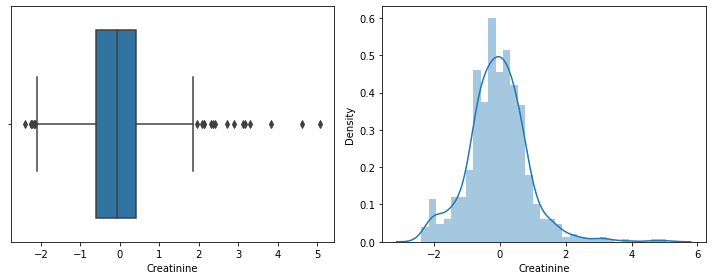

In [81]:
plt.figure(figsize = (10,4))
plt.subplot(1,2,1)
sns.boxplot(X['Creatinine'])
plt.subplot(1,2,2)
sns.distplot(X['Creatinine'])
plt.tight_layout()

In [82]:
X['Creatinine'] = np.where(X['Creatinine'] >2, 2, X['Creatinine'])
X['Creatinine'] = np.where(X['Creatinine'] <-2, -2, X['Creatinine'])

In [83]:
X.skew()

Patient age quantile                               -0.297845
Hematocrit                                         -0.249897
Hemoglobin                                         -0.199735
Platelets                                           0.223333
Mean platelet volume                                0.266795
Red blood Cells                                    -0.098686
Lymphocytes                                         0.162241
Mean corpuscular hemoglobin concentration (MCHC)   -0.573389
Leukocytes                                          0.673393
Basophils                                           0.627234
Mean corpuscular hemoglobin (MCH)                  -0.303035
Eosinophils                                         1.228814
Mean corpuscular volume (MCV)                      -0.164859
Monocytes                                           0.397714
Red blood cell distribution width (RDW)             0.580998
Neutrophils                                         0.044838
Proteina C reativa mg/dL

In [84]:
X.corr()

,Patient age quantile,Hematocrit,Hemoglobin,Platelets,Mean platelet volume,Red blood Cells,Lymphocytes,Mean corpuscular hemoglobin concentration (MCHC),Leukocytes,Basophils,Mean corpuscular hemoglobin (MCH),Eosinophils,Mean corpuscular volume (MCV),Monocytes,Red blood cell distribution width (RDW),Neutrophils,Proteina C reativa mg/dL,Creatinine
Patient age quantile,1.000000,0.141162,0.100006,-0.208970,0.151326,0.001445,-0.127463,-0.129541,-0.171070,0.140676,0.252363,0.035059,0.328550,0.069259,0.163119,0.045779,0.107458,0.482096
Hematocrit,0.141162,1.000000,0.966677,-0.120201,0.090358,0.851172,-0.000230,0.126467,-0.105946,0.172456,0.071654,0.053395,0.028293,0.074528,-0.174214,-0.039544,-0.220123,0.454142
Hemoglobin,0.100006,0.966677,1.000000,-0.151691,0.085982,0.828082,-0.006987,0.361882,-0.115734,0.161309,0.164615,0.038754,0.008186,0.085567,-0.259134,-0.037438,-0.205581,0.447689
Platelets,-0.208970,-0.120201,-0.151691,1.000000,-0.379886,-0.096887,0.121260,-0.159103,0.481293,-0.000709,-0.147356,0.188994,-0.082155,-0.217466,0.015106,-0.043044,-0.077701,-0.324413
Mean platelet volume,0.151326,0.090358,0.085982,-0.379886,1.000000,0.067844,0.085875,0.000458,-0.159280,0.119329,0.071801,-0.040983,0.078511,0.057523,0.026025,-0.107650,-0.093862,0.178748
Red blood Cells,0.001445,0.851172,0.828082,-0.096887,0.067844,1.000000,-0.025307,0.111438,-0.076689,0.136328,-0.343810,0.000618,-0.438720,0.050242,-0.095276,-0.007586,-0.129572,0.342040
Lymphocytes,-0.127463,-0.000230,-0.006987,0.121260,0.085875,-0.025307,1.000000,-0.026689,-0.314267,0.272915,0.018503,0.253856,0.036305,0.081538,-0.092841,-0.869614,-0.397253,-0.151338
Mean corpuscular hemoglobin concentration (MCHC),-0.129541,0.126467,0.361882,-0.159103,0.000458,0.111438,-0.026689,1.000000,-0.069753,-0.004463,0.416343,-0.058327,-0.029583,0.064998,-0.395180,-0.014283,0.009779,0.082076
Leukocytes,-0.171070,-0.105946,-0.115734,0.481293,-0.159280,-0.076689,-0.314267,-0.069753,1.000000,-0.322260,-0.146990,-0.079699,-0.122766,-0.310725,0.156086,0.397199,0.265013,-0.178366
Basophils,0.140676,0.172456,0.161309,-0.000709,0.119329,0.136328,0.272915,-0.004463,-0.322260,1.000000,0.089903,0.393227,0.085297,0.138487,-0.032664,-0.396131,-0.258609,0.158611


<AxesSubplot:>

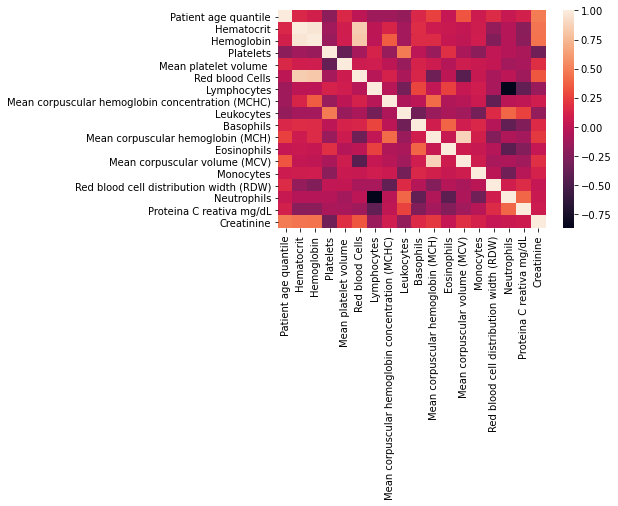

In [85]:
sns.heatmap(X.corr())

- Hematocrit and Hemoglobin = 0.966677
- Red blood Cells and Hematocrit = 0.851172
- Red blood Cells and Hemoglobin = 0.828082
- Mean corpuscular hemoglobin (MCH) and Mean corpuscular volume (MCV) = 0.882311
- Neutrophils and Lymphocytes = -0.869614

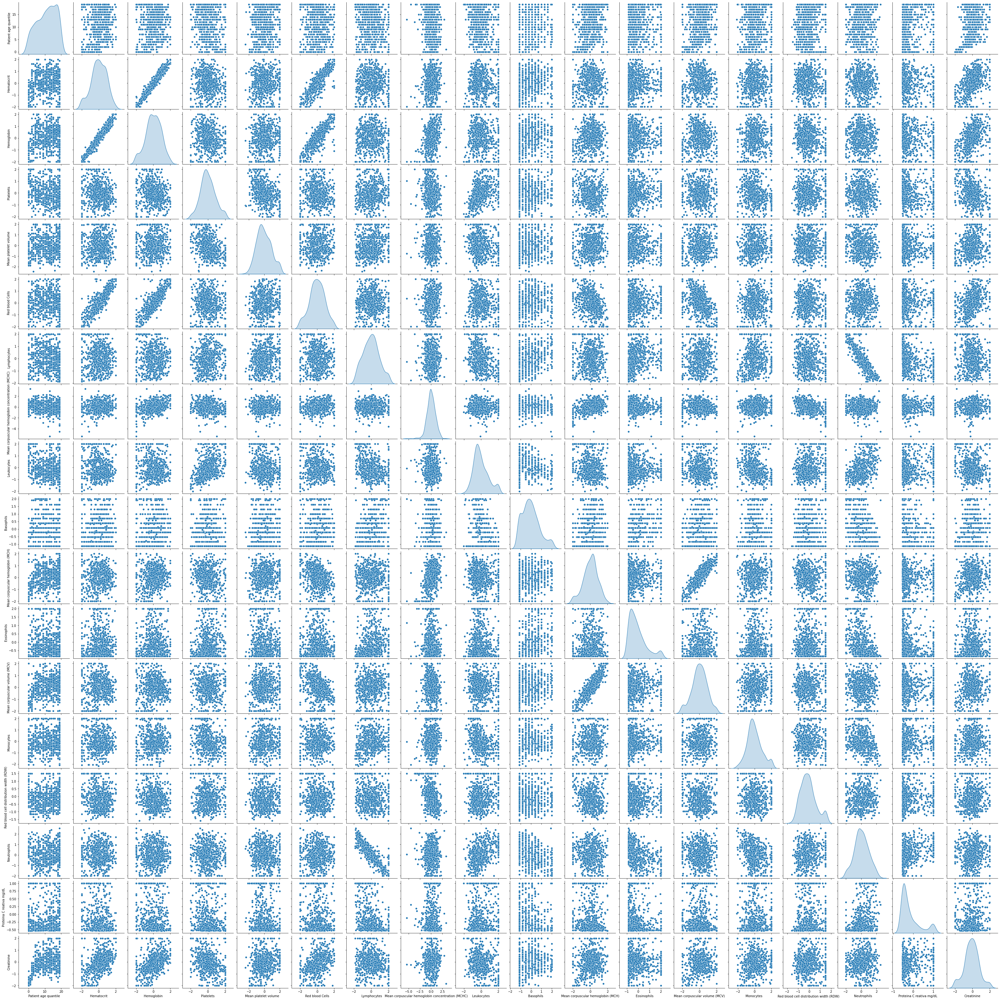

In [86]:
sns.pairplot(X, diag_kind= "kde")

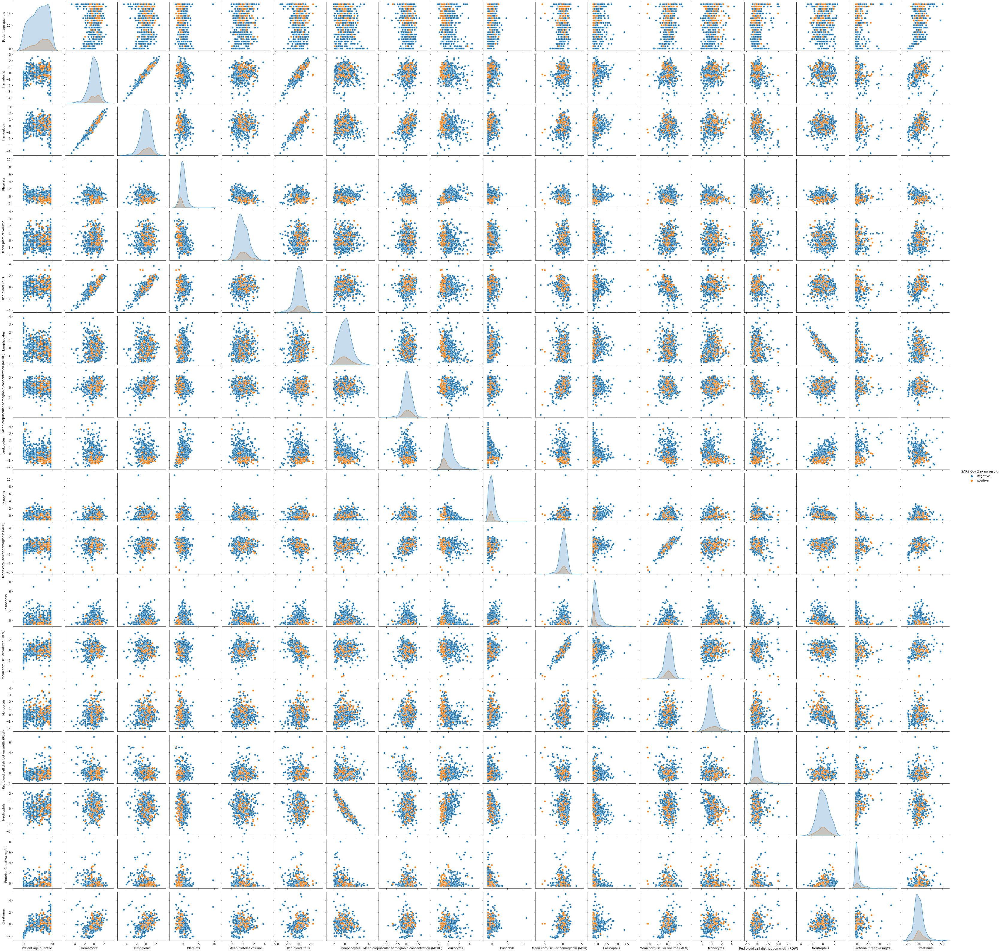

In [87]:
sns.pairplot(covidDF,diag_kind='kde',hue='SARS-Cov-2 exam result')

In [86]:
import scipy.stats as stats
X = X.apply(stats.zscore)

In [87]:
X.head()

,Patient age quantile,Hematocrit,Hemoglobin,Platelets,Mean platelet volume,Red blood Cells,Lymphocytes,Mean corpuscular hemoglobin concentration (MCHC),Leukocytes,Basophils,Mean corpuscular hemoglobin (MCH),Eosinophils,Mean corpuscular volume (MCV),Monocytes,Red blood cell distribution width (RDW),Neutrophils,Proteina C reativa mg/dL,Creatinine
0,0.362607,0.338697,0.278457,-0.340537,-0.557449,0.195206,0.546104,-0.094408,-0.402454,-0.528687,0.404962,0.186049,0.503215,0.885090,-0.668139,-0.421463,-0.006840,0.344625
1,1.052002,0.246233,-0.043303,-0.602684,0.045575,0.120834,0.345666,-1.006202,-0.080147,-0.229043,-0.390313,2.013578,0.178530,0.448088,-0.770075,-0.736231,0.003232,2.503209
2,-0.499136,0.128084,0.334416,-0.066608,0.624477,0.563150,0.380928,0.838111,-0.076864,0.145511,-0.074728,-0.168381,-0.498671,0.454074,-0.642655,0.039129,-0.017752,-0.151692
3,-1.016183,1.021905,1.019904,-0.160863,0.190300,0.684494,0.696432,0.568717,-0.569844,0.295333,0.278728,0.119593,-0.030196,0.280471,-0.234909,-0.458808,0.655399,-0.143420
4,0.707305,0.015073,-0.071282,-0.316973,-0.460966,-0.176653,0.056144,0.216432,-0.615137,0.145511,-0.150468,0.019910,-0.257476,0.507951,0.019932,-0.668654,-0.328307,-0.060701


##### Model Building

In [88]:
from sklearn.model_selection import train_test_split

In [89]:
X.shape

(664, 18)

In [90]:
Y.shape

(664,)

In [91]:
X.isnull().sum()

Patient age quantile                                0
Hematocrit                                          0
Hemoglobin                                          0
Platelets                                           0
Mean platelet volume                                0
Red blood Cells                                     0
Lymphocytes                                         0
Mean corpuscular hemoglobin concentration (MCHC)    0
Leukocytes                                          0
Basophils                                           0
Mean corpuscular hemoglobin (MCH)                   0
Eosinophils                                         0
Mean corpuscular volume (MCV)                       0
Monocytes                                           0
Red blood cell distribution width (RDW)             0
Neutrophils                                         0
Proteina C reativa mg/dL                            0
Creatinine                                          0
dtype: int64

In [92]:
Y.isnull().sum()

0

In [93]:
from sklearn import metrics
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report, confusion_matrix

In [94]:
# Split X and y into training and test set in 70:30 ratio

X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.30, random_state=1)

In [95]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors= 20, weights = 'distance')
knn.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=20, weights='distance')

In [96]:
y_pred_knn = knn.predict(X_train)
print(accuracy_score(y_train, y_pred_knn))

0.9741379310344828


In [97]:
predicted_labels = knn.predict(X_test)
knn.score(X_test, y_test)

0.86

In [98]:
from sklearn import metrics

print(metrics.confusion_matrix(y_test, predicted_labels))

[[165   7]
 [ 21   7]]


In [99]:
print(classification_report(y_test,predicted_labels))

              precision    recall  f1-score   support

    negative       0.89      0.96      0.92       172
    positive       0.50      0.25      0.33        28

    accuracy                           0.86       200
   macro avg       0.69      0.60      0.63       200
weighted avg       0.83      0.86      0.84       200



In [100]:
from sklearn.metrics import roc_curve

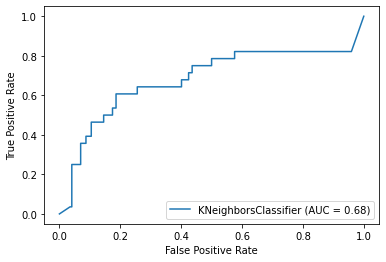

In [101]:
metrics.plot_roc_curve(knn, X_test, y_test)

In [102]:
pred_knn_prob = knn.predict_proba(X_test)

In [103]:
from sklearn.metrics import roc_auc_score

# auc scores
auc_score_knn = roc_auc_score(y_test, pred_knn_prob[:,1])
print(auc_score_knn)

0.6803363787375416


In [104]:
from sklearn.linear_model import LogisticRegression

logreg = LogisticRegression()
logreg.fit(X_train,y_train)
# Accuracy of Training set
y_pred_logreg = logreg.predict(X_train)
print(accuracy_score(y_train, y_pred_logreg))

# Accuracy of Test set
y_pred_logreg = logreg.predict(X_test)
print(accuracy_score(y_test, y_pred_logreg))

print(classification_report(y_test,y_pred_logreg))

0.8512931034482759
0.88
              precision    recall  f1-score   support

    negative       0.90      0.97      0.93       172
    positive       0.62      0.36      0.45        28

    accuracy                           0.88       200
   macro avg       0.76      0.66      0.69       200
weighted avg       0.86      0.88      0.87       200



In [105]:
confusion_matrix_log = metrics.confusion_matrix(y_test,y_pred_logreg)
confusion_matrix_log

array([[166,   6],
       [ 18,  10]], dtype=int64)

In [106]:
pred_logreg_prob = logreg.predict_proba(X_test)

In [107]:
# auc scores
auc_score_logreg = roc_auc_score(y_test, pred_logreg_prob[:,1])
print(auc_score_logreg)

0.8137458471760798


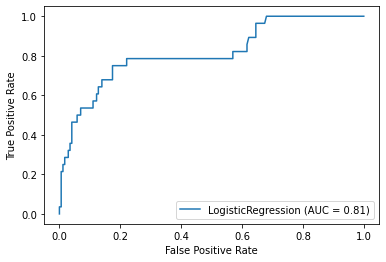

In [108]:
metrics.plot_roc_curve(logreg, X_test, y_test)

In [109]:
from sklearn.naive_bayes import GaussianNB

nb = GaussianNB()
nb.fit(X_train,y_train)
# Accuracy of Training set
y_pred_nb = nb.predict(X_train)
print(accuracy_score(y_train, y_pred_nb))

# Accuracy of Test set
y_pred_nb = nb.predict(X_test)
print(accuracy_score(y_test, y_pred_nb))

print(classification_report(y_test,y_pred_nb))

0.8017241379310345
0.795
              precision    recall  f1-score   support

    negative       0.95      0.81      0.87       172
    positive       0.38      0.71      0.49        28

    accuracy                           0.80       200
   macro avg       0.66      0.76      0.68       200
weighted avg       0.87      0.80      0.82       200



In [110]:
confusion_matrix_nb = metrics.confusion_matrix(y_test,y_pred_nb)
confusion_matrix_nb

array([[139,  33],
       [  8,  20]], dtype=int64)

0.8461378737541528


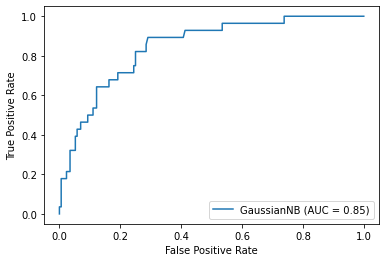

In [111]:
pred_nb_prob = nb.predict_proba(X_test)

# auc scores
auc_score_nb = roc_auc_score(y_test, pred_nb_prob[:,1])
print(auc_score_nb)

metrics.plot_roc_curve(nb, X_test, y_test)

In [112]:
from sklearn.svm import SVC
svclassifier = SVC(kernel='linear')
svclassifier.fit(X_train, y_train)

SVC(kernel='linear')

In [113]:
# Accuracy of Training set
y_pred_train = svclassifier.predict(X_train)
accuracy_score(y_train,y_pred_train)

0.8297413793103449

In [114]:
# Accuracy of Test set
y_pred_test = svclassifier.predict(X_test)
accuracy_score(y_test,y_pred_test)

0.86

In [115]:
print(classification_report(y_test,y_pred_test))

              precision    recall  f1-score   support

    negative       0.86      1.00      0.92       172
    positive       0.00      0.00      0.00        28

    accuracy                           0.86       200
   macro avg       0.43      0.50      0.46       200
weighted avg       0.74      0.86      0.80       200



In [116]:
confusion_matrix_svc = metrics.confusion_matrix(y_test,y_pred_test)
confusion_matrix_svc

array([[172,   0],
       [ 28,   0]], dtype=int64)

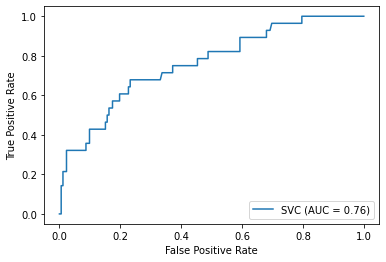

In [117]:
#pred_svc_prob = svclassifier.predict_proba(X_test)

# auc scores
#auc_score_svc = roc_auc_score(y_test, pred_svc_prob[:,1])
#print(auc_score_svc)

metrics.plot_roc_curve(svclassifier, X_test, y_test)

In [118]:
from sklearn.tree import DecisionTreeClassifier

dt_model = DecisionTreeClassifier(criterion = 'entropy' )
dt_model.fit(X_train, y_train)

# Accuracy of Training set
y_pred_train = dt_model.predict(X_train)
accuracy_score(y_train,y_pred_train)

0.9741379310344828

In [119]:
# Accuracy of Test set
y_pred_test = dt_model.predict(X_test)
accuracy_score(y_test,y_pred_test)

0.765

In [120]:
print(classification_report(y_test,y_pred_test))

              precision    recall  f1-score   support

    negative       0.93      0.79      0.85       172
    positive       0.32      0.61      0.42        28

    accuracy                           0.77       200
   macro avg       0.62      0.70      0.64       200
weighted avg       0.84      0.77      0.79       200



In [121]:
confusion_matrix_dt_model = metrics.confusion_matrix(y_test,y_pred_test)
confusion_matrix_dt_model

array([[136,  36],
       [ 11,  17]], dtype=int64)

0.6875


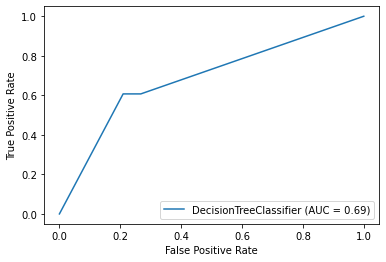

In [122]:
pred_dt_prob = dt_model.predict_proba(X_test)

# auc scores
auc_score_dt = roc_auc_score(y_test, pred_dt_prob[:,1])
print(auc_score_dt)

metrics.plot_roc_curve(dt_model, X_test, y_test)

In [123]:
reg_dt_model = DecisionTreeClassifier(criterion = 'entropy' ,max_depth = 5, min_samples_leaf = 5)

reg_dt_model.fit(X_train, y_train)

# Accuracy of Training set
y_pred_train = reg_dt_model.predict(X_train)
accuracy_score(y_train,y_pred_train)

0.8706896551724138

In [124]:
# Accuracy of Test set
y_pred_test = reg_dt_model.predict(X_test)
accuracy_score(y_test,y_pred_test)

0.885

In [125]:
print(classification_report(y_test,y_pred_test))

              precision    recall  f1-score   support

    negative       0.91      0.96      0.93       172
    positive       0.63      0.43      0.51        28

    accuracy                           0.89       200
   macro avg       0.77      0.69      0.72       200
weighted avg       0.87      0.89      0.88       200



In [126]:
confusion_matrix_reg_dt = metrics.confusion_matrix(y_test,y_pred_test)
confusion_matrix_reg_dt

array([[165,   7],
       [ 16,  12]], dtype=int64)

0.8370016611295681


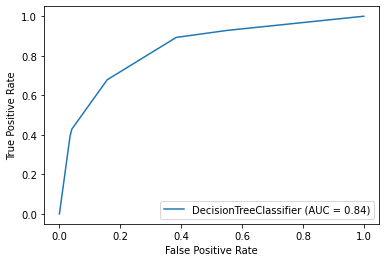

In [127]:
pred_reg_dt_prob = reg_dt_model.predict_proba(X_test)

# auc scores
auc_score_reg_dt = roc_auc_score(y_test, pred_reg_dt_prob[:,1])
print(auc_score_reg_dt)

metrics.plot_roc_curve(reg_dt_model, X_test, y_test)

In [128]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(criterion="entropy", n_estimators= 100)
rf.fit(X_train, y_train)

# Accuracy of Training set
y_pred_train = rf.predict(X_train)
accuracy_score(y_train,y_pred_train)

0.9741379310344828

In [129]:
# Accuracy of Test set
y_pred_test = rf.predict(X_test)
accuracy_score(y_test,y_pred_test)

0.88

In [130]:
confusion_matrix_rf = metrics.confusion_matrix(y_test,y_pred_test)
confusion_matrix_rf

array([[165,   7],
       [ 17,  11]], dtype=int64)

In [131]:
print(classification_report(y_test,y_pred_test))

              precision    recall  f1-score   support

    negative       0.91      0.96      0.93       172
    positive       0.61      0.39      0.48        28

    accuracy                           0.88       200
   macro avg       0.76      0.68      0.71       200
weighted avg       0.87      0.88      0.87       200



0.7819767441860465


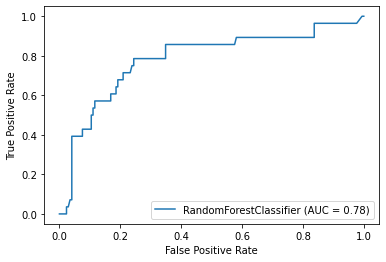

In [132]:
pred_rf_prob = rf.predict_proba(X_test)

# auc scores
auc_score_rf = roc_auc_score(y_test, pred_rf_prob[:,1])
print(auc_score_rf)

metrics.plot_roc_curve(rf, X_test, y_test)

In [133]:
from sklearn.ensemble import AdaBoostClassifier

ad = AdaBoostClassifier(base_estimator=reg_dt_model)
ad.fit(X_train,y_train)

accuracy_score(y_train, ad.predict(X_train))

0.9741379310344828

In [134]:
accuracy_score(y_test, ad.predict(X_test))

0.81

In [135]:
confusion_matrix(y_test, ad.predict(X_test))

array([[156,  16],
       [ 22,   6]], dtype=int64)

In [136]:
print(classification_report(y_test,ad.predict(X_test)))

              precision    recall  f1-score   support

    negative       0.88      0.91      0.89       172
    positive       0.27      0.21      0.24        28

    accuracy                           0.81       200
   macro avg       0.57      0.56      0.57       200
weighted avg       0.79      0.81      0.80       200



0.7155315614617941


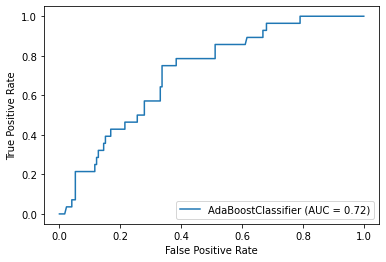

In [137]:
pred_ada_prob = ad.predict_proba(X_test)

# auc scores
auc_score_ada = roc_auc_score(y_test, pred_ada_prob[:,1])
print(auc_score_ada)

metrics.plot_roc_curve(ad, X_test, y_test)

In [138]:
from sklearn.ensemble import BaggingClassifier

bgcl = BaggingClassifier(n_estimators=200)

bgcl.fit(X_train,y_train)

accuracy_score(y_train, bgcl.predict(X_train))

0.9741379310344828

In [139]:
accuracy_score(y_test, bgcl.predict(X_test))

0.86

In [140]:
confusion_matrix(y_test, bgcl.predict(X_test))

array([[159,  13],
       [ 15,  13]], dtype=int64)

In [141]:
print(classification_report(y_test,bgcl.predict(X_test)))

              precision    recall  f1-score   support

    negative       0.91      0.92      0.92       172
    positive       0.50      0.46      0.48        28

    accuracy                           0.86       200
   macro avg       0.71      0.69      0.70       200
weighted avg       0.86      0.86      0.86       200



0.7657807308970099


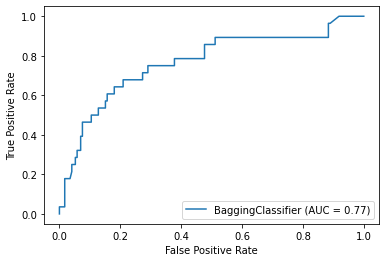

In [142]:
pred_bgcl_prob = bgcl.predict_proba(X_test)

# auc scores
auc_score_bgcl = roc_auc_score(y_test, pred_bgcl_prob[:,1])
print(auc_score_bgcl)

metrics.plot_roc_curve(bgcl, X_test, y_test)

In [143]:
from sklearn.ensemble import GradientBoostingClassifier

gbcl = GradientBoostingClassifier()
gbcl.fit(X_train,y_train)

accuracy_score(y_train, gbcl.predict(X_train))

0.9719827586206896

In [144]:
accuracy_score(y_test, gbcl.predict(X_test))

0.84

In [145]:
confusion_matrix(y_test, gbcl.predict(X_test))

array([[156,  16],
       [ 16,  12]], dtype=int64)

In [146]:
print(classification_report(y_test,gbcl.predict(X_test)))

              precision    recall  f1-score   support

    negative       0.91      0.91      0.91       172
    positive       0.43      0.43      0.43        28

    accuracy                           0.84       200
   macro avg       0.67      0.67      0.67       200
weighted avg       0.84      0.84      0.84       200



0.8166528239202658


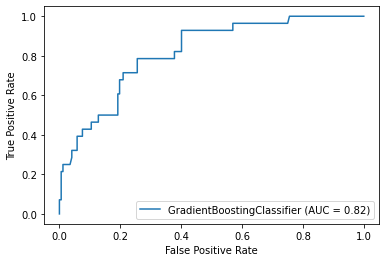

In [147]:
pred_gbcl_prob = gbcl.predict_proba(X_test)

# auc scores
auc_score_gbcl = roc_auc_score(y_test, pred_gbcl_prob[:,1])
print(auc_score_gbcl)

metrics.plot_roc_curve(gbcl, X_test, y_test)

In [148]:
from sklearn.ensemble import StackingClassifier
sc = StackingClassifier(estimators= [("NNH", KNeighborsClassifier()),("logreg", LogisticRegression()),("nb",GaussianNB()),("svclassifier",SVC()),("reg_dt_model",DecisionTreeClassifier()),("dt_model",DecisionTreeClassifier()),("rf", RandomForestClassifier()), ("bgcl", BaggingClassifier()),("gbcl", GradientBoostingClassifier())])

In [149]:
sc.fit(X_train, y_train)
                        
accuracy_score(y_train, sc.predict(X_train))

0.8879310344827587

In [150]:
accuracy_score(y_test, sc.predict(X_test))

0.89

In [151]:
confusion_matrix(y_test, sc.predict(X_test))

array([[168,   4],
       [ 18,  10]], dtype=int64)

In [152]:
print(classification_report(y_test,sc.predict(X_test)))

              precision    recall  f1-score   support

    negative       0.90      0.98      0.94       172
    positive       0.71      0.36      0.48        28

    accuracy                           0.89       200
   macro avg       0.81      0.67      0.71       200
weighted avg       0.88      0.89      0.87       200



0.8594269102990033


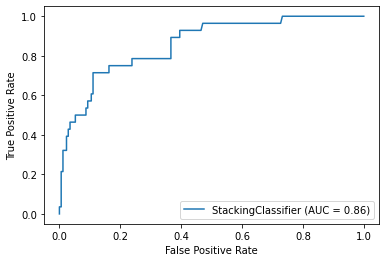

In [153]:
pred_stack_prob = sc.predict_proba(X_test)

# auc scores
auc_score_stack = roc_auc_score(y_test, pred_stack_prob[:,1])
print(auc_score_stack)

metrics.plot_roc_curve(sc, X_test, y_test)

In [154]:
sc1 = StackingClassifier(estimators= [("NNH", KNeighborsClassifier()),("logreg", LogisticRegression()),("nb",GaussianNB()),("svclassifier",SVC()),("reg_dt_model",DecisionTreeClassifier()),("dt_model",DecisionTreeClassifier()),("rf", RandomForestClassifier())])

In [155]:
sc1.fit(X_train, y_train)
                        
accuracy_score(y_train, sc1.predict(X_train))

0.8771551724137931

In [156]:
accuracy_score(y_test, sc1.predict(X_test))

0.89

In [157]:
confusion_matrix(y_test, sc1.predict(X_test))

array([[169,   3],
       [ 19,   9]], dtype=int64)

In [158]:
print(classification_report(y_test,sc1.predict(X_test)))

              precision    recall  f1-score   support

    negative       0.90      0.98      0.94       172
    positive       0.75      0.32      0.45        28

    accuracy                           0.89       200
   macro avg       0.82      0.65      0.69       200
weighted avg       0.88      0.89      0.87       200



0.8552740863787375


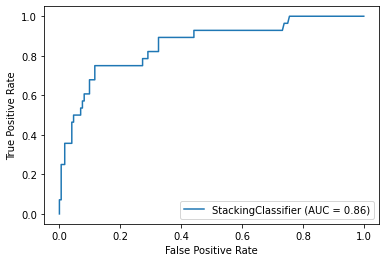

In [159]:
pred_stack1_prob = sc1.predict_proba(X_test)

# auc scores
auc_score_stack1 = roc_auc_score(y_test, pred_stack1_prob[:,1])
print(auc_score_stack1)

metrics.plot_roc_curve(sc1, X_test, y_test)

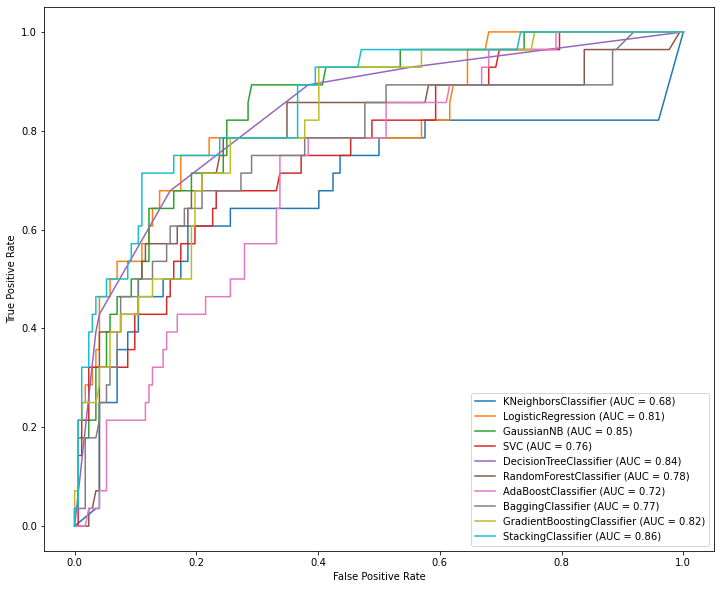

In [167]:
plt.figure(figsize = (12,10))
from sklearn.metrics import plot_roc_curve
classifiers = [knn, logreg, nb, svclassifier, reg_dt_model, rf, ad, bgcl, gbcl, sc  ]
ax = plt.gca()
for i in classifiers:
    plot_roc_curve(i, X_test, y_test, ax=ax)